# 3.0.x: Visualizing the trait maps


## Imports and config


In [167]:
from pathlib import Path

import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import xarray as xr

from src.conf.conf import get_config
from src.conf.environment import log
from src.utils.dataset_utils import (
    get_aoa_dir,
    get_cov_dir,
    get_final_fns,
    get_predict_dir,
)
from src.utils.plotting_utils import set_font
from src.utils.raster_utils import open_raster
from src.utils.trait_utils import get_trait_number_from_id, load_trait_mapping

cfg = get_config()

traits_of_interest = ["4", "11", "14", "18", "26", "3113"]
mapping = load_trait_mapping()
for trait in traits_of_interest:
    print(f"{trait}: {mapping[trait]['short']}")

set_font("FreeSans")

4: SSD
11: SLA
14: Leaf N (mass)
18: Plant height
26: Seed mass
3113: Leaf area (3113)


## Trait map exemplar


In [168]:
predict_fns = [
    list((f / "splot_gbif").glob("*.tif"))[0]
    for f in get_predict_dir().iterdir()
    if f.is_dir() and get_trait_number_from_id(f.stem) in traits_of_interest
]

In [173]:
test_map = predict_fns[0]

r = open_raster(test_map).sel(band=1)

aoi_afr_bbox = (8, 32, 70, -35)
aoi_amr_bbox = (-86, -62, 49, -56)
coarsen = 4
use_fns = predict_fns

aois_afr = [
    open_raster(r)
    .sel(band=1)
    .sel(x=slice(*aoi_afr_bbox[:2]), y=slice(*aoi_afr_bbox[2:]))
    .coarsen(x=coarsen, y=coarsen)
    .mean()
    for r in use_fns
]

aois_amr = [
    open_raster(r)
    .sel(band=1)
    .sel(x=slice(*aoi_amr_bbox[:2]), y=slice(*aoi_amr_bbox[2:]))
    .coarsen(x=coarsen, y=coarsen)
    .mean()
    for r in use_fns
]

Plot the AOIs


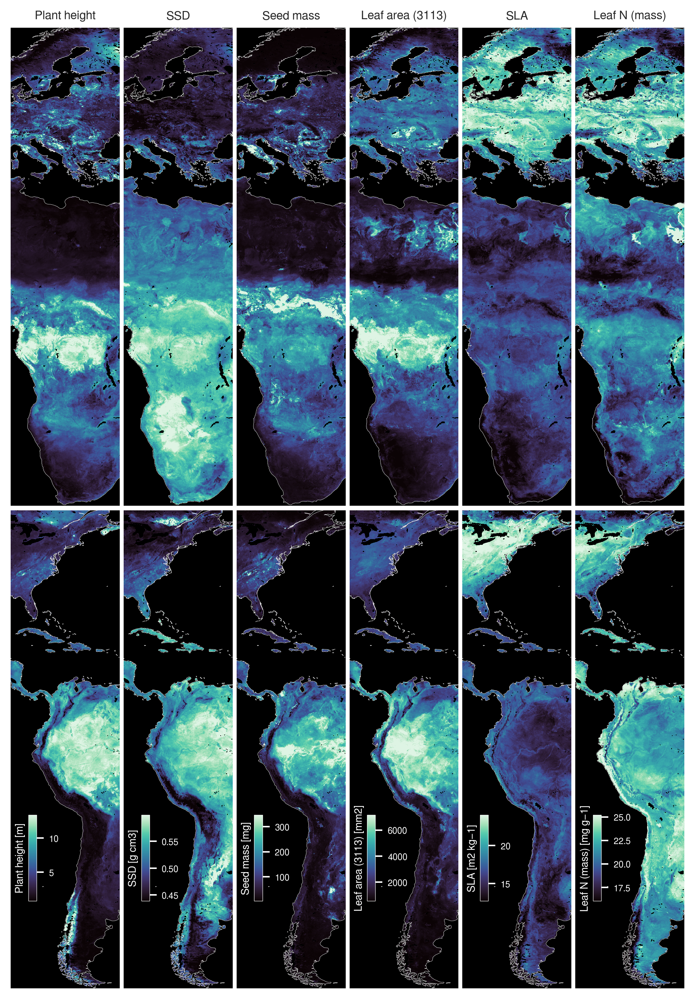

In [175]:
SAVE = True

cmap = sns.color_palette("mako", as_cmap=True)

nrows = 2
ncols = len(use_fns)
width = 8.3 * 2
height = 11.7 * 2 / nrows

fig, axes = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    figsize=(width, height),
    dpi=300,
    subplot_kw={"projection": ccrs.PlateCarree()},
)

for i, (aoi, ax, fn) in enumerate(zip(aois_afr + aois_amr, axes.ravel(), use_fns * 2)):
    min_val = aoi.quantile(0.02).values
    max_val = aoi.quantile(0.98).values
    add_colorbar = i >= ncols
    mapping_entry = mapping[get_trait_number_from_id(fn.stem)]

    left, *_, right = aoi.x
    top, *_, bottom = aoi.y
    extent = [left, right, bottom, top]
    ax.imshow(
        aoi,
        cmap=cmap,
        vmin=min_val,
        vmax=max_val,
        transform=ccrs.PlateCarree(),
        extent=extent,
    )

    ax.set_title("")
    ax.coastlines(linewidth=0.2, color="white")
    ax.set_facecolor("black")

    # Remove border from subplots
    ax.spines["geo"].set_visible(False)

    if i < ncols:
        ax.set_title(
            mapping[get_trait_number_from_id(use_fns[i].stem)]["short"], fontsize=8, y=1
        )
    else:
        cax = ax.images[0]
        bbox = ax.get_position()
        # Calculate the colorbar's position
        padding_x = 0.01  # Padding on the left
        padding_y = 0.07  # Padding on the bottom

        cbar_width = bbox.width * 0.075
        cbar_height = bbox.height * 0.18

        cbar_x = bbox.x0 + padding_x  # Bottom-left corner with padding
        cbar_y = bbox.y0 + padding_y

        # Add a new axes for the colorbar
        cbar_ax = fig.add_axes([cbar_x, cbar_y, cbar_width, cbar_height])

        # Add the colorbar
        cb = fig.colorbar(cax, cax=cbar_ax, orientation="vertical")

        cb.set_label(
            f"{mapping_entry['short']} [{mapping_entry['unit']}]",
            color="white",
            labelpad=2,
            fontsize=7,
        )
        cb.ax.yaxis.set_label_position("left")
        cb.ax.yaxis.set_ticks_position("right")
        cb.ax.tick_params(color="white", labelcolor="white", labelsize=6)
        for spine in cb.ax.spines.values():
            spine.set_edgecolor("white")  # Set the border color
            spine.set_linewidth(0.3)  # Optional: Set the border width

    plt.subplots_adjust(wspace=-0.86, hspace=0.01)

if SAVE:
    plt.savefig("results/figures/trait-maps.png", dpi=300, bbox_inches="tight")

## Coefficient of variation and area of applicability


To understand whether the inclusion of citizen science data improves model generalization, we can compare the coefficient of variation (COV) rasters from models trained only on vegetation survey data (SCI) with models trained on a combination of survey data and citizen science data (COMB).

To best visualize the general influence across traits, we can compute the average COV across our traits of interest for each trait set, and plot the means in both raster form for visual assessment as well as in histogram plots.


Gather filenames and load COV rasters.


In [4]:
# Using fewer traits this time due to errors in COV calculation during the TRY5-STG-001
# run (this may have been due to the presence of negative values in the predictions)
traits_of_interest = ["4", "11", "14"]
splot_fns = [
    list((f / "splot").glob("*.tif"))[0]
    for f in sorted(list(get_cov_dir().iterdir()))
    if f.is_dir() and get_trait_number_from_id(f.stem) in traits_of_interest
]

comb_fns = [
    list((f / "splot_gbif").glob("*.tif"))[0]
    for f in sorted(list(get_cov_dir().iterdir()))
    if f.is_dir() and get_trait_number_from_id(f.stem) in traits_of_interest
]

splot_covs = [open_raster(f).sel(band=1) for f in splot_fns]
comb_covs = [open_raster(f).sel(band=1) for f in comb_fns]

splot_covs = xr.Dataset({f"{da.attrs['trait']}": da for da in splot_covs})
comb_covs = xr.Dataset({f"{da.attrs['trait']}": da for da in comb_covs})

Compute the average COV across both trait sources.


In [5]:
splot_mean = splot_covs.to_array(dim="mean").mean(dim="mean")
comb_mean = comb_covs.to_array(dim="mean").mean(dim="mean")

Gather the filenames and load the AOA rasters.


In [1]:
splot_aoa_fns = [
    list((f / "splot").glob("*.tif"))[0]
    for f in sorted(list(get_aoa_dir().iterdir()))
    if f.is_dir() and get_trait_number_from_id(f.stem) in traits_of_interest
]
splot_aoas = [open_raster(f, masked=True).sel(band=2) for f in splot_aoa_fns]

# Fix incorrect nodata encoding
splot_aoas = [xr.where((da == 0) | (da == 1), da, np.nan) for da in splot_aoas]

comb_final_fns = [
    f for f in get_final_fns() if get_trait_number_from_id(f.stem) in traits_of_interest
]
comb_aoas = [open_raster(f).sel(band=3) for f in comb_final_fns]


splot_aoas = xr.Dataset({f"{f.stem}": da for da, f in zip(splot_aoas, splot_aoa_fns)})
comb_aoas = xr.Dataset({f"{da.attrs['trait']}": da for da in comb_aoas})

NameError: name 'get_aoa_dir' is not defined

Compute the AOA mode for both trait sources.


In [7]:
splot_aoa = splot_aoas.to_array(dim="band").sum(dim="band", skipna=False)
majority_thresh = len(traits_of_interest) / 2
splot_aoa = xr.where(splot_aoa >= majority_thresh, 1, splot_aoa)

comb_aoa = comb_aoas.to_array(dim="band").sum(dim="band", skipna=False)
comb_aoa = xr.where(comb_aoa >= majority_thresh, 1, comb_aoa)

Combine the sPlot and combined AOAs to be able to generate a single plot.


In [8]:
both_aoa = xr.where(
    (splot_aoa == 1) & (comb_aoa == 1),
    1,
    xr.where(
        (splot_aoa == 1) & (comb_aoa == 0),
        2,
        xr.where((splot_aoa == 0) & (comb_aoa == 1), 3, np.nan),
    ),
)

Coarsen all maps for plotting.


In [165]:
extent = [-180, 180, 90, -60]
coarsen = 10

splot_cov = (
    splot_mean.sel(x=slice(*extent[:2]), y=slice(*extent[2:]))
    .coarsen(x=coarsen, y=coarsen)
    .mean()
)
comb_cov = (
    comb_mean.sel(x=slice(*extent[:2]), y=slice(*extent[2:]))
    .coarsen(x=coarsen, y=coarsen)
    .mean()
)

all_aoa = (
    both_aoa.sel(x=slice(*extent[:2]), y=slice(*extent[2:]))
    .coarsen(x=coarsen, y=coarsen)
    .median()
)

Include AOA statistics


In [10]:
aoa_res = pd.read_parquet("results/all_aoa.parquet")

In [11]:
filt_res = aoa_res.query(
    "transform == 'none' and "
    "(trait_set == 'splot_gbif' or trait_set == 'splot')"
    # "r2 >= 0.2"
)

resolutions = filt_res.resolution.unique()

# Filter out models where we don't have both a splot and splot_gbif model
for res in resolutions:
    res_res = filt_res.query(f"resolution == '{res}'")
    splot_traits = res_res.query("trait_set == 'splot'").trait_id.unique()
    comb_traits = res_res.query("trait_set == 'splot_gbif'").trait_id.unique()

    # Identify the traits that are in both sets
    common_traits = set(splot_traits).intersection(set(comb_traits))

    # Filter out the models that don't have both trait sets
    filt_res = filt_res.query(
        f"not (resolution == '{res}' and trait_set == 'splot' and trait_id not in {list(common_traits)})"
    )

Prepare AOA stats for plotting in a scatterplot


In [12]:
resolutions = filt_res.resolution.unique()
aoa_data = pd.DataFrame()

for res in resolutions:
    res_res = filt_res.query(f"resolution == '{res}'")
    splot = res_res.query("trait_set == 'splot'").set_index("trait_id")["aoa"]
    comb = res_res.query("trait_set == 'splot_gbif'").set_index("trait_id")["aoa"]

    merged = pd.merge(
        splot, comb, left_index=True, right_index=True, suffixes=("_splot", "_comb")
    )
    merged["resolution"] = res
    aoa_data = pd.concat([aoa_data, merged], ignore_index=True).sort_values(
        "resolution", ascending=True
    )

resolution_map = {
    "001": "0.01",
    "02": "0.2",
    "05": "0.5",
    "1": "1",
    "2": "2",
}

aoa_data["resolution"] = aoa_data["resolution"].map(resolution_map)

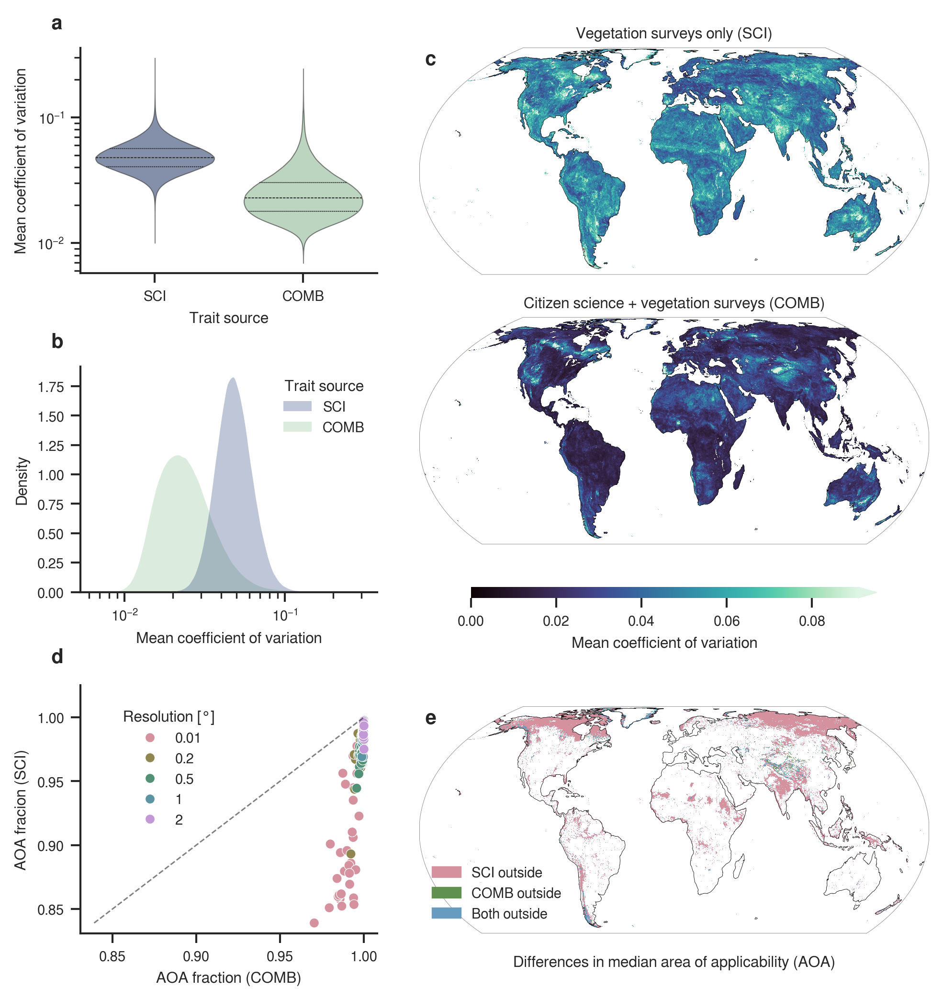

In [166]:
from matplotlib.pyplot import tight_layout
import pandas as pd
from matplotlib import gridspec
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

SAVE = True

vmin = 0.02
vmax = 0.175
nrows = 1
ncols = 2
width = 12
height = 8

# sns.plotting_context("paper", font_scale=1)
sns.set_theme(context="paper", style="ticks", font="FreeSans", font_scale=0.8)

fig = plt.figure(figsize=(width, height), dpi=300)
gs = gridspec.GridSpec(
    nrows, ncols, figure=fig, width_ratios=[0.8, 4], hspace=0, wspace=-0.5
)
# Create a nested GridSpec within the first column to add padding
spacer = 0.4
plot = 1
left_width = 1
nested_gs_left = gridspec.GridSpecFromSubplotSpec(
    3,
    1,
    subplot_spec=gs[:, 0],
    height_ratios=[plot, plot, 1.1],
    width_ratios=[left_width],
    hspace=spacer,
)
nested_gs_right = gridspec.GridSpecFromSubplotSpec(
    5,
    3,
    subplot_spec=gs[:, 1],
    height_ratios=[1, 1, 0.05, 0.1, 1],
    width_ratios = [1, 0.9, 1],
    hspace=0.3
)

# Create the first subplot (spanning the middle two rows in the nested GridSpec)
# ax1 = fig.add_subplot(nested_gs[1:3, 0])
ax0_0 = fig.add_subplot(nested_gs_left[0, 0])
ax0_1 = fig.add_subplot(nested_gs_left[1, 0])
ax0_2 = fig.add_subplot(nested_gs_left[2, 0])
ax1_0 = fig.add_subplot(nested_gs_right[0, :], projection=ccrs.EqualEarth())
ax1_1 = fig.add_subplot(nested_gs_right[1, :], projection=ccrs.EqualEarth())
ax1_2 = fig.add_subplot(nested_gs_right[2, 1], frameon=False)
ax1_3 = fig.add_subplot(nested_gs_right[4, :], projection=ccrs.EqualEarth())

cmap = sns.color_palette("mako", as_cmap=True)

##### ax0
df = pd.DataFrame(
    {
        "Mean coefficient of variation": splot_cov.values.flatten().tolist()
        + comb_cov.values.flatten().tolist(),
        "Trait source": ["SCI"] * len(splot_cov.values.flatten())
        + ["COMB"] * len(comb_cov.values.flatten()),
    }
)

pdf_cmap = sns.color_palette("crest", as_cmap=True)
desat = 1
color_start = sns.desaturate(pdf_cmap(0.1), desat)
color_end = sns.desaturate(pdf_cmap(0.9), desat)


sns.violinplot(
    data=df,
    x="Trait source",
    y="Mean coefficient of variation",
    ax=ax0_0,
    palette=[color_end, color_start],
    alpha=0.6,
    hue="Trait source",
    log_scale=True,
    inner="quartile",
    linewidth=0.5,
    cut=0,
)
sns.despine(ax=ax0_0)


##### ax2
sns.kdeplot(
    data=df,
    x="Mean coefficient of variation",
    hue="Trait source",
    fill=True,
    multiple="layer",
    # palette=sns.color_palette("crest", 2, desat=0.75),
    palette=[color_end, color_start],
    alpha=0.3,
    linewidth=0,
    ax=ax0_1,
    log_scale=(True, False),
)

legend = ax0_1.get_legend()
legend.set_frame_on(False)

sns.despine(ax=ax0_1)


##### ax4

palette = sns.color_palette("husl", n_colors=len(resolution_map), desat=0.5)
sns.scatterplot(
    data=aoa_data,
    x="aoa_comb",
    y="aoa_splot",
    hue="resolution",
    palette=palette,
    ax=ax0_2,
    # s=50,
    linewidth=0.3,
)

# Set legend title to "Resolution [°]"
handles, labels = ax0_2.get_legend_handles_labels()
ax0_2.legend(
    handles=handles[0:],
    labels=labels[0:],
    title="Resolution [°]",
    frameon=False,
    # fontsize=8,
    # title_fontsize=8,
    # move the legend to the right a few pixels
    loc="upper left",
    bbox_to_anchor=(0.1, 0.95),
)

# include a 1:1 line
p1 = min(aoa_data["aoa_splot"].min(), aoa_data["aoa_comb"].min())
p2 = max(aoa_data["aoa_splot"].max(), aoa_data["aoa_comb"].max())
ax0_2.plot([p1, p2], [p1, p2], color="black", linestyle="--", alpha=0.5, lw=0.7)

ax0_2.set_xlabel("AOA fraction (COMB)")
ax0_2.set_ylabel("AOA fracion (SCI)")

# Round ax0_2 y ticks to 2 decimal places
# ax0_2.set_yticklabels([f"{tick:.2f}" for tick in ax0_2.get_yticks()])

# Ensure y-ticks are the same as x-ticks
# ax0_2.set_xlim(0.82, 1.01)
ax0_2.set_yticks(ax0_2.get_xticks())
xmin = ax0_2.get_xlim()[0]
ax0_2.set_ylim(bottom=xmin, top=1.025)
# Get x min
# ax0_2.set_yticklabels(ax0_2.get_xticklabels())
# stop yticks after 1

# fig.suptitle(
#     "AOA comparison between sPlot-only\nand Combined models ($R^2 \\geq 0.2$)", y=1.05
# )
sns.despine(ax=ax0_2)

##### ax1, ax3, ax5
# vmin = comb_cov.quantile(0.05).values
vmin = 0
vmax = splot_cov.quantile(0.99).values

ims = []
for i, (cov, ax) in enumerate(
    zip([splot_cov, comb_cov, all_aoa], [ax1_0, ax1_1, ax1_3])
):
    map_extent = (
        cov.x.values.min(),
        cov.x.values.max(),
        cov.y.values.min(),
        cov.y.values.max(),
    )
    if i == 2:
        vmin, vmax = None, None
        cmap = ListedColormap(sns.color_palette("husl", 3, desat=0.5).as_hex())
        cmap.colors = cmap.colors[-1:] + cmap.colors[:-1]  # Shift the colors by 0.5

        # cmap = ListedColormap(
        #     [
        #         sns.desaturate((0.8, 0.6, 0.8), 0.5),  # light purple
        #         sns.desaturate((1.0, 0.6, 0.6), 0.5),  # light red
        #         sns.desaturate((0.6, 0.8, 1.0), 0.5),  # light blue
        #     ]
        # )

    xx, yy = np.meshgrid(cov.x, cov.y)
    im = ax.pcolormesh(
        xx,
        yy,
        cov.values,
        cmap=cmap,
        transform=ccrs.PlateCarree(),
        # extent=map_extent,
        # resample=False,
        # aspect="auto",
        # aspect=1.4,
        shading="auto",
        rasterized=True,
        vmin=vmin,
        vmax=vmax,
    )
    # else:
    #     im = ax.imshow(
    #         cov,
    #         # norm=LogNorm(vmin=vmin, vmax=vmax),
    #         transform=ccrs.PlateCarree(),
    #         extent=map_extent,
    #         cmap=cmap,
    #         vmin=vmin,
    #         vmax=vmax,
    #     )
    ims.append(im)
    ax.set_extent(map_extent, crs=ccrs.PlateCarree())
    ax.coastlines(linewidth=0.2, color="black")
    # ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
    for spine in ax.spines.values():
        spine.set_linewidth(0.2)
        spine.set_edgecolor("grey")

    if i == 2:
        legend_labels = ["Both outside", "SCI outside", "COMB outside"]
        legend_colors = [cmap(i) for i in range(3)]
        legend_patches = [
            Patch(color=color, label=label)
            for color, label in zip(legend_colors, legend_labels)
        ]

        # Reorder legend patches such that the first item is the last item
        legend_patches = legend_patches[1:] + legend_patches[:1]

        ax.legend(handles=legend_patches, loc="lower left", frameon=False)

ax1_0.set_title("Vegetation surveys only (SCI)", y=0.99)
ax1_1.set_title("Citizen science + vegetation surveys (COMB)", y=0.99)


# Add a single colorbar for plots ax2 and ax3
# for spine in ax1_2.spines.values():
#     spine.set_linewidth(0)

# # Remove ticks
ax1_2.set_xticks([])

cbar = fig.colorbar(
    ims[1],
    cax=ax1_2,
    location="bottom",
    orientation="horizontal",
    # pad=1,
    extend="max",
    use_gridspec=True,
    label="Mean coefficient of variation",
    panchor=(1, 0.5)
)

letter_size = 10
ax0_0.text(
    -0.1,
    1.15,
    "a",
    transform=ax0_0.transAxes,
    fontsize=letter_size,
    verticalalignment="top",
    fontweight="bold",
)

ax0_1.text(
    -0.1,
    1.15,
    "b",
    transform=ax0_1.transAxes,
    fontsize=letter_size,
    verticalalignment="top",
    fontweight="bold",
)
ax1_0.text(
    0.01,
    0.99,
    "c",
    transform=ax1_0.transAxes,
    fontsize=letter_size,
    verticalalignment="top",
    fontweight="bold",
)

ax0_2.text(
    -0.1,
    1.15,
    "d",
    transform=ax0_2.transAxes,
    fontsize=letter_size,
    verticalalignment="top",
    fontweight="bold",
)

ax1_3.text(
    0.01,
    0.99,
    "e",
    transform=ax1_3.transAxes,
    fontsize=letter_size,
    verticalalignment="top",
    fontweight="bold",
)

ax1_3.set_title("Differences in median area of applicability (AOA)", y=-0.2)

for s in cbar.ax.spines.values():
    s.set_linewidth(0.2)
    # s.set_edgecolor("grey")

if SAVE:
    plt.savefig("results/figures/spatial-transfer.png", dpi=300, bbox_inches="tight")

Calculate the mean COV across SCI and COMB.


In [20]:
import xarray as xr

# Combine the list of DataArrays into a single Dataset
splot_dataset = xr.concat(splot_covs, dim="band")

# Calculate the mean across the 'band' dimension
# splot_mean_cov = splot_dataset.mean(dim='band')

# print(splot_mean_cov)

## Area of applicability differences


To visualize the differences in area of applicability between vegetation survey models and those based on vegetion surveys combined with citizen science data, we can investigate the difference in area of applicability in specific regions.


In [3]:
trait_of_interest = "11"  # SLA

splot_aoa_fn = [
    f for f in (get_aoa_dir() / f"X{trait_of_interest}_mean" / "splot").glob("*.tif")
][0]
splot_aoa = open_raster(splot_aoa_fn, masked=True).sel(band=2)
splot_aoa = splot_aoa.where((splot_aoa == 1) | (splot_aoa == 0), np.nan)

comb_final_fn = [f for f in get_final_fns() if f"X{trait_of_interest}_mean" in f.stem][
    0
]
comb_aoa = open_raster(comb_final_fn).sel(band=3)

/home/dl1070/miniforge3/envs/traits-py311/lib/python3.11/site-packages/rioxarray/_io.py:671: UserWarning: Offsets differ across bands. The 'scale_factor' attribute will not be added. See the 'scales' attribute.
  warnings.warn(
/home/dl1070/miniforge3/envs/traits-py311/lib/python3.11/site-packages/rioxarray/_io.py:680: UserWarning: Offsets differ across bands. The 'add_offset' attribute will not be added. See the 'offsets' attribute.
  warnings.warn(


In [4]:
both_aoa = xr.where(
    (splot_aoa == 1) & (comb_aoa == 1),
    1,
    xr.where(
        (splot_aoa == 1) & (comb_aoa == 0),
        2,
        xr.where((splot_aoa == 0) & (comb_aoa == 1), 3, np.nan),
    ),
)

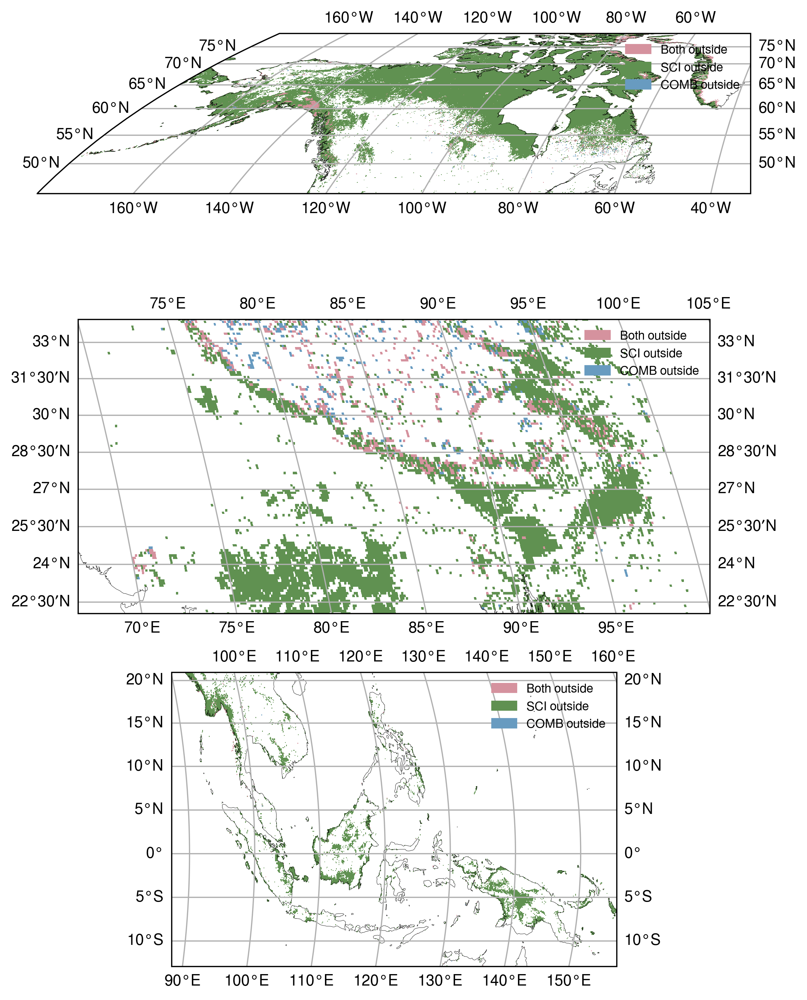

In [37]:
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# Define a custom colormap with distinct colors for each value
custom_cmap = ListedColormap(["green", "yellow", "blue"])

# Define bounding boxes with the same aspect ratio
# aspect_ratio = 2
himalayas = (70, 100, 34, 22)
# chile = (-75, -65, -20, -30)
se_asia = (90, 156, 21, -13)
northern_canada = (-180, -44, 80, 45)

bboxes = [northern_canada, himalayas, se_asia]

coarsen = 10
dpi = 300
# a4 width in inches
width_inches = 8.3
height_inches = 11.7
nrows = len(bboxes)
ncols = 1

fig, axes = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    subplot_kw={"projection": ccrs.EqualEarth()},
    dpi=dpi,
    figsize=(width_inches, height_inches),
)

for bbox, ax in zip(bboxes, axes.ravel()):
    aoa = (
        both_aoa.sel(x=slice(*bbox[:2]), y=slice(*bbox[2:]))
        .coarsen(x=coarsen, y=coarsen, boundary="pad")
        .median()
    )

    # Set colormap to only contain three colors from sns husl
    custom_cmap = ListedColormap(sns.color_palette("husl", 3, desat=0.5))

    map_extent = (
        aoa.x.values.min(),
        aoa.x.values.max(),
        aoa.y.values.min(),
        aoa.y.values.max(),
    )
    xx, yy = np.meshgrid(aoa.x, aoa.y)
    im = ax.pcolormesh(
        xx,
        yy,
        aoa.values,
        cmap=custom_cmap,
        transform=ccrs.PlateCarree(),
        # extent=map_extent,
        # resample=False,
        # aspect="auto",
        shading="auto",
        rasterized=True,
    )

    # Create a legend with three swatches

    legend_labels = ["Both outside", "SCI outside", "COMB outside"]
    legend_colors = [custom_cmap(i) for i in range(3)]
    legend_patches = [
        Patch(color=color, label=label)
        for color, label in zip(legend_colors, legend_labels)
    ]

    ax.legend(handles=legend_patches, loc="upper right", fontsize=8, frameon=False)

    ax.set_extent(map_extent, crs=ccrs.PlateCarree())

    ax.coastlines(linewidth=0.2, color="black")
    ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)

In [86]:
from src.utils.raster_utils import xr_to_raster


xr_to_raster(both_aoa, "test_both_aoa.tif")